In [8]:
import pandas as pd
from pathlib import Path
import yaml

import pandas as pd
import numpy as np

In [2]:
from retsupp.utils.data import Subject
from retsupp.utils.utils import create_animation

In [3]:
subject = 14
bids_folder = Path('/data/ds-retsupp')
sub = Subject(subject)
stimulus = sub.get_stimulus(resolution=30)
onsets = sub.get_onsets()

settings = sub.get_experimental_settings()
settings

speed = settings['speed']
bar_width = settings['bar_width']
fov_size = settings['fov_size']

14 1 1
14 1 1
14 1 1


In [4]:
from nilearn import plotting, image, input_data
mask = sub.get_retinotopic_atlas(True)

v1_mask = image.math_img('mask == 1', mask=mask)
v1_mask.to_filename('/data/ds-retsupp/derivatives/volume_masks/sub-14/v1_mask.nii.gz')

/Users/gdehol/git/retsupp/retsupp/utils/data.py:452: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  varea_img = image.resample_to_img(varea_img, target_img=func_mask, interpolation='nearest', force_resample=True)


In [5]:
mean_ts = bids_folder / 'derivatives' / 'mean_signal' / f'sub-{subject:02d}'/ f'sub-{subject:02d}_desc-mean_bold.nii.gz'

In [9]:
masker = input_data.NiftiMasker(mask_img=v1_mask)

v1_ts = masker.fit_transform(mean_ts)

In [11]:
np.save(Path('~/git/computation-in-neuroeconomics-workshop2025/notebooks/resources/stimulus.npy').expanduser(), stimulus.astype(bool))
np.save(Path('~/git/computation-in-neuroeconomics-workshop2025/notebooks/resources/v1_ts.npy').expanduser(), v1_ts)

In [12]:
create_animation(stimulus, )

In [18]:
stimulus.shape

(258, 30, 30)

In [28]:
spm_hrf?

Signature:
spm_hrf(
    t,
    a1=6.0,
    d1=1.0,
    a2=16.0,
    d2=1.0,
    c=0.16666666666666666,
    highres_dt=0.1,
)
Docstring:
Compute SPM canonical HRF(s).

Args:
    t: tensor [T, M]
    a1, d1, a2, d2, c: scalars or tensors broadcastable to [T, M]
    dt: scalar time step

Returns:
    Tensor [T, M] normalized HRFs
File:      ~/git/braincoder/braincoder/hrf.py
Type:      function

In [ ]:
from braincoder.hrf import spm_hrf
import numpy as np

# Define HRF
tr = 1.7
t = np.arange(tr/2., 20 + tr/2., tr, dtype=np.float32)
hrf = spm_hrf(t, a1=4.5, d1=0.5).numpy()[:, 0]
hrf = hrf / np.sum(hrf)  # Normalize HRF to preserve amplitude

# Stimulus shape: (time, height, width)
n_time, height, width = stimulus.shape
stimulus_2d = stimulus.reshape(n_time, -1)  # (time, pixels)

# Convolve each pixel's time series with the HRF
convolved_stimulus_2d = np.zeros_like(stimulus_2d)
for i in range(stimulus_2d.shape[1]):
    convolved_stimulus_2d[:, i] = np.convolve(stimulus_2d[:, i], hrf, mode='same')

# Reshape back to original spatial dimensions
convolved_stimulus = convolved_stimulus_2d.reshape(n_time, height, width)

print(convolved_stimulus.shape)  # Should match stimulus.shape

(258, 30, 30)


In [37]:
create_animation(convolved_stimulus*20)

In [31]:
hrf

array([ 0.0000000e+00,  4.2062715e-02,  9.4326837e-03,  1.0614453e-03,
       -1.8345861e-05, -4.2072256e-04, -1.0043707e-03, -1.6291344e-03,
       -2.0009158e-03, -1.9820556e-03, -1.6541522e-03, -1.2003800e-03],
      dtype=float32)

In [25]:
print(spm_hrf(t).shape)  # Should be (n_timepoints,)



(12, 1)


In [ ]:
spm_hrf?

In [5]:
import numpy as np

tr = 1.7
n_volumes = 238

bar = onsets[onsets['event_type'].apply(lambda x: x.startswith('bar'))]
radius_bar_aperture = settings['radius_bar_aperture']
bar_width = settings['bar_width']

speed =  settings['speed']

frametimes = np.arange(tr/2., tr*n_volumes + tr/2., tr)

for i, t in enumerate(frametimes):

    if t < bar['onset'].min():
        stimulus[i, :, :] = 0
        continue

    current_state = bar[bar['onset'] < t].iloc[-1]['event_type']
    dt = t - bar[bar['onset'] < t].iloc[-1]['onset']


    if current_state in ['bar_rest', 'bar_break']:
        stimulus[int(t/tr), :, :] = 0
        ori = 0
        pos = 100
    elif current_state in ['bar_right']:
        ori = 0
        pos = -radius_bar_aperture - bar_width / 2 + dt * speed
    elif current_state in ['bar_left']:
        ori = 0
        pos = radius_bar_aperture + bar_width / 2 - dt * speed
    elif current_state in ['bar_up']:
        ori = 90
        pos = -radius_bar_aperture - bar_width / 2 + dt * speed
    elif current_state in ['bar_down']:
        ori = 90
        pos = radius_bar_aperture + bar_width / 2 - dt * speed

    print(t, current_state, dt, pos)
    # stimulus[i, ...] = draw_bar(grid_coordinates, pos, ori, bar_width) * mask

14.449999999999998 bar_right 0.04600901603698482 -3.554770485305787
16.15 bar_right 1.7460090160369859 -3.2691704853057866
17.849999999999998 bar_right 3.446009016036985 -2.983570485305787
19.549999999999997 bar_right 5.1460090160369845 -2.697970485305787
21.25 bar_right 6.846009016036987 -2.412370485305787
22.95 bar_right 8.546009016036987 -2.1267704853057867
24.65 bar_right 10.246009016036986 -1.8411704853057866
26.349999999999998 bar_right 11.946009016036985 -1.555570485305787
28.049999999999997 bar_right 13.646009016036984 -1.269970485305787
29.749999999999996 bar_right 15.346009016036984 -0.9843704853057869
31.449999999999996 bar_right 17.046009016036983 -0.6987704853057872
33.15 bar_right 18.746009016036986 -0.4131704853057867
34.849999999999994 bar_right 20.44600901603698 -0.12757048530578752
36.55 bar_right 22.146009016036984 0.158029514694213
38.24999999999999 bar_right 23.84600901603698 0.44362951469421263
39.949999999999996 bar_right 25.546009016036983 0.7292295146942132
41.

In [6]:
create_animation(stimulus)

In [10]:
!ls /data/ds-retsupp/sourcedata/behavior/logs/sub-1

ses-2 ses-3


In [ ]:
sub = 

In [21]:
bids_folder = Path('/data/ds-retsupp')
subject = '03'
session = 1
yml_file = bids_folder / 'sourcedata' / 'behavior' / 'logs' / f'sub-{subject}' / f'ses-{session+1}' / f'run-1' / f'sub-{subject}_ses-{session+1}_task-ret_sup_run-1_expsettings.yml'

# Load yml file
with open(yml_file, 'r') as file:
    settings = yaml.safe_load(file)

In [58]:
import numpy as np

eccentricity_stimuli = settings['experiment'].get('eccentricity_stimulus', 5)
size_stimuli = settings['experiment'].get('size_stimuli', 1)
radius_bar_aperture = eccentricity_stimuli - size_stimuli / 1.8
radius_bar_aperture
speed = settings["bar_stimulus"]["speed"]
bar_width = (radius_bar_aperture * 2) / 8
fov_size = radius_bar_aperture * 2

resolution = 100
grid_coordinates_1d = np.linspace(-radius_bar_aperture, radius_bar_aperture, resolution)
grid_coordinates = np.meshgrid(grid_coordinates_1d, grid_coordinates_1d)

grid_x, grid_y = grid_coordinates

def draw_bar(grid_coordinates, pos, ori, bar_width):

    # Grid coordinates are 2D arrays

    assert ori in [0, 90], "Orientation must be 0 or 90 degrees"
    bar = np.zeros_like(grid_coordinates[0])

    x, y = grid_coordinates

    if ori == 0:
        bar[np.abs(x - pos) < bar_width / 2] = 1
    elif ori == 90:
        bar[np.abs(y - pos) < bar_width / 2] = 1
    return bar

In [59]:
speed

0.168

In [60]:
(56.810475	- 14.395629) * speed

7.125694128

In [61]:
(104.032660	- 61.61787456) * speed

7.125683953920002

In [65]:
(radius_bar_aperture * 2 )

6.333333333333334

In [51]:
bar

,trial_nr,onset,event_type,phase,response,nr_frames,distractor_color,target_orientation,distractor_location,dot_presence_ 0,...,dot_presence_ 5,dot_presence_ 6,dot_presence_ 7,target_location,correct,HPL_distractor,correct_response,rt,onset_abs,duration
13,NaN,14.395629,bar_right,NaN,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.884085,0.014455
86,NaN,56.810475,bar_rest,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.298931,0.097601
94,NaN,61.617874,bar_left,NaN,NaN,60.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,105.106330,0.190962
156,NaN,104.032660,bar_rest,NaN,NaN,540.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,147.521116,1.574394
165,NaN,108.833347,bar_down,NaN,NaN,120.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,152.321803,0.274194
233,NaN,151.249437,bar_rest,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,194.737893,0.056072
243,NaN,156.050141,bar_up,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,199.538597,0.055986
314,NaN,198.463387,bar_rest,NaN,NaN,120.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,241.951843,0.240814
324,NaN,203.263959,bar_break,NaN,NaN,120.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,246.752415,0.240993
332,NaN,208.066295,bar_rest,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,251.554751,0.839529


In [67]:
radius_bar_aperture

3.166666666666667

In [69]:
radius_bar_aperture

3.166666666666667

In [72]:
import numpy as np
import matplotlib.pyplot as plt

def draw_bar(grid_coordinates, pos, ori, bar_width):

    # Grid coordinates are 2D arrays

    assert ori in [0, 90], "Orientation must be 0 or 90 degrees"
    bar = np.zeros_like(grid_coordinates[0])

    x, y = grid_coordinates

    if ori == 0:
        bar[np.abs(x - pos) < bar_width / 2] = 1
    elif ori == 90:
        bar[np.abs(y - pos) < bar_width / 2] = 1
    return bar
    
tr = 1.6
frametimes = np.arange(tr/2., tr*258 + tr/2., tr)
onsets = pd.read_csv(bids_folder / 'sourcedata' / 'behavior' / 'logs' / f'sub-{subject}' / f'ses-{session+1}' / f'run-5' / f'sub-{subject}_ses-{session+1}_task-ret_sup_run-5_events.tsv', sep='\t')
pulses = onsets[onsets['event_type'] == 'pulse']
print(f'Number of pulses: {len(pulses)}')
onsets['onset'] = onsets['onset'] - pulses['onset'].min()
bar = onsets[onsets['event_type'].apply(lambda x: x.startswith('bar'))]

resolution = 100
grid_coordinates_1d = np.linspace(-radius_bar_aperture, radius_bar_aperture, resolution)
grid_coordinates = np.meshgrid(grid_coordinates_1d, grid_coordinates_1d)

grid_x, grid_y = grid_coordinates

mask = np.sqrt(grid_x**2 + grid_y**2) <= radius_bar_aperture

stimulus = np.zeros((len(frametimes), resolution, resolution))

ori = 0
pos = -fov_size - bar_width

for i, t in enumerate(frametimes):

    if t < bar['onset'].min():
        stimulus[i, :, :] = 0
        continue

    current_state = bar[bar['onset'] < t].iloc[-1]['event_type']
    dt = t - bar[bar['onset'] < t].iloc[-1]['onset']


    if current_state in ['bar_rest', 'bar_break']:
        stimulus[int(t/tr), :, :] = 0
        ori = 0
        pos = 100
    elif current_state in ['bar_right']:
        ori = 0
        pos = -radius_bar_aperture - bar_width / 2 + dt * speed
    elif current_state in ['bar_left']:
        ori = 0
        pos = radius_bar_aperture + bar_width / 2 - dt * speed
    elif current_state in ['bar_up']:
        ori = 90
        pos = radius_bar_aperture + bar_width / 2 - dt * speed
    elif current_state in ['bar_down']:
        ori = 90
        pos = -radius_bar_aperture - bar_width / 2 + dt * speed

    stimulus[i, ...] = draw_bar(grid_coordinates, pos, ori, bar_width) * mask

    print(f'Time: {t}: {current_state}, dt: {dt}, pos: {pos}, ori: {ori}')




Number of pulses: 258
Time: 15.200000000000003: bar_right, dt: 0.8043708324432401, pos: -10.260699033482869, ori: 0
Time: 16.800000000000004: bar_right, dt: 2.4043708324432416, pos: -9.99189903348287, ori: 0
Time: 18.400000000000002: bar_right, dt: 4.004370832443239, pos: -9.72309903348287, ori: 0
Time: 20.000000000000004: bar_right, dt: 5.604370832443241, pos: -9.454299033482869, ori: 0
Time: 21.600000000000005: bar_right, dt: 7.204370832443242, pos: -9.18549903348287, ori: 0
Time: 23.200000000000003: bar_right, dt: 8.80437083244324, pos: -8.91669903348287, ori: 0
Time: 24.800000000000004: bar_right, dt: 10.404370832443242, pos: -8.647899033482869, ori: 0
Time: 26.400000000000006: bar_right, dt: 12.004370832443243, pos: -8.37909903348287, ori: 0
Time: 28.000000000000007: bar_right, dt: 13.604370832443244, pos: -8.11029903348287, ori: 0
Time: 29.600000000000005: bar_right, dt: 15.204370832443242, pos: -7.841499033482869, ori: 0
Time: 31.200000000000006: bar_right, dt: 16.80437083244324

In [73]:
from matplotlib.animation import FuncAnimation
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set the limit for embedding animations
rcParams['animation.embed_limit'] = 2**128

# Assuming `stimulus` is already defined
# Example definition for `radius_bar_aperture` and `frametimes`
radius_bar_aperture = 10  # Example value, adjust as needed
frametimes = range(len(stimulus))  # Example frame times

fig, ax = plt.subplots(figsize=(8, 8))

def update(frame):
    ax.clear()
    ax.set_xlim(-radius_bar_aperture, radius_bar_aperture)
    ax.set_ylim(-radius_bar_aperture, radius_bar_aperture)
    ax.set_aspect('equal')

    # Use `extent` to set the data limits of the image
    extent = [-radius_bar_aperture, radius_bar_aperture, -radius_bar_aperture, radius_bar_aperture]
    ax.imshow(stimulus[frame, :, :], cmap='gray', vmin=0, vmax=1, extent=extent)
    return ax

ani = FuncAnimation(fig, update, frames=len(frametimes), interval=250)

# Show the animation in notebook
plt.close(fig)  # Prevents static display of the last frame
HTML(ani.to_jshtml())

# Save the animation
# Ensure the directory exists before saving
# ani.save('path_to_save_animation.mp4', fps=30, extra_args=['-vcodec', 'libx264'])


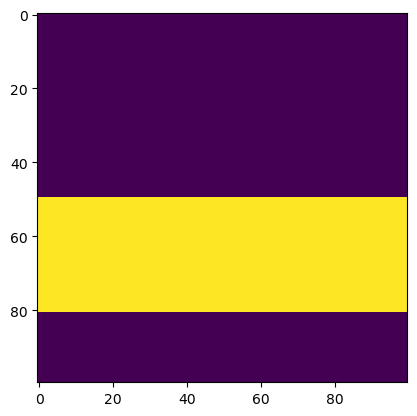

In [123]:
plt.imshow(draw_bar(grid_coordinates_2d, 1, ori, 2.))

In [77]:
bar

,trial_nr,onset,event_type,phase,response,nr_frames,distractor_color,target_orientation,distractor_location,dot_presence_ 0,...,dot_presence_ 4,dot_presence_ 5,dot_presence_ 6,dot_presence_ 7,target_location,correct,correct_response,rt,onset_abs,duration
13,NaN,14.394432,bar_right,NaN,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49.809222,0.014471
40,NaN,30.228861,bar_rest,NaN,NaN,120.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.643651,0.474230
45,NaN,32.228992,bar_left,NaN,NaN,60.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.643782,0.274254
70,NaN,48.066232,bar_rest,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.481022,0.839572
75,NaN,50.073509,bar_down,NaN,NaN,348.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.488299,2.732754
99,NaN,65.909184,bar_rest,NaN,NaN,61.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.323974,0.199134
104,NaN,67.910906,bar_up,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.325696,0.197732
129,NaN,83.745227,bar_break,NaN,NaN,348.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119.160017,2.657703
142,NaN,93.746510,bar_rest,NaN,NaN,540.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,129.161300,0.657682
147,NaN,95.748196,bar_right,NaN,NaN,180.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,131.162986,1.156401


In [75]:
current_state

'intro_dummy_scan'

In [60]:
grid_coordinates_2d[0]

array([[-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667],
       [-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667],
       [-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667],
       ...,
       [-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667],
       [-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667],
       [-3.16666667, -3.1026936 , -3.03872054, ...,  3.03872054,
         3.1026936 ,  3.16666667]])

In [55]:
len(frametimes)

258

In [40]:
onsets

,trial_nr,onset,event_type,phase,response,nr_frames,distractor_color,target_orientation,distractor_location,dot_presence_ 0,...,dot_presence_ 4,dot_presence_ 5,dot_presence_ 6,dot_presence_ 7,target_location,correct,correct_response,rt,onset_abs,duration
0,0.0,0.015138,start_exp,0.0,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.891645,33.532984
1,0.0,33.538283,pulse,0.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.414790,NaN
2,0.0,33.548122,intro_dummy_scan,1.0,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.424629,14.307461
3,0.0,35.128713,pulse,1.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.005220,NaN
4,0.0,36.728960,pulse,1.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.605467,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,61.0,441.531053,pulse,0.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.407560,NaN
663,61.0,443.131182,pulse,0.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,445.007689,NaN
664,61.0,444.731444,pulse,0.0,t,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,446.607951,NaN
665,61.0,446.239947,end_exp,1.0,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,448.116454,0.100023


1       40.323468
3       41.908035
4       43.508267
5       45.108487
6       46.708533
          ...    
660    445.109679
661    446.709835
662    448.308741
663    449.908982
664    451.509101
Name: onset_abs, Length: 258, dtype: float64

<Axes: xlabel='onset_abs', ylabel='Count'>

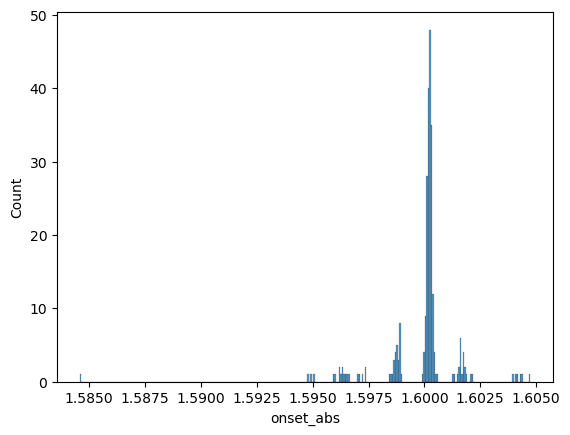

In [32]:
import seaborn as sns
sns.histplot(onsets[onsets['event_type'] == 'pulse']['onset_abs'].diff())

In [10]:
!ls /data/ds-retsupp/sourcedata/behavior/sub-1/ses-2/

ls: /data/ds-retsupp/sourcedata/behavior/sub-1/ses-2/: No such file or directory
